In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import os
import warnings
import geopandas as gpd
import plotly.express as px
import missingno as msno 
import re


### Loading Zillow and Airbnb dataset 

In [2]:
zillow= pd.read_csv("C:/Users/harki/Desktop/Capital One/New folder/Zip_Zhvi_2bedroom.csv")
airbnb=pd.read_csv("C:/Users/harki/Downloads/listings.csv.gz")

C:\Users\harki\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning:

Columns (43,61,62,94,95) have mixed types. Specify dtype option on import or set low_memory=False.



#### Reporting number of rows and columns loaded

In [3]:
print("Shape of Airbnb loaded: ",airbnb.shape)
print("Number of Zillow loaded: ",zillow.shape)

Shape of Airbnb loaded:  (48895, 106)
Number of Zillow loaded:  (8946, 262)


# Step 1 : Quality Check

#### Merging Airbnb and Zillow dataset on Zipcode for New york. RegionName in zillow represents Zip code of where the property is located. 
Dropped zipcodes that were present in incorrect format('11692-2304','11249\n11249') in the airbnb dataset but not in zillow to smoothly perform merging of the two datasets.


In [4]:
zillow=zillow[zillow['State']=='NY']
airbnb=airbnb[~airbnb['zipcode'].isin(['11103-3233','10002-2289','11385-2308','11413-3220','11692-2304','11249\n11249'])]
airbnb['zipcode'].dropna(inplace=True)
airbnb['zipcode']=airbnb['zipcode'].astype(str).astype(float).astype(int)
temp_df=airbnb.merge(zillow, left_on='zipcode', right_on='RegionName')
# airbnb[airbnb['zipcode']=='11385-2308']
# temp_df

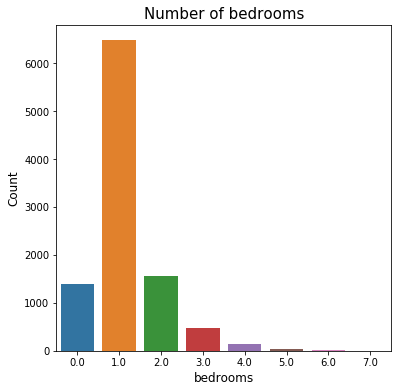

In [5]:
bed_count = temp_df.groupby('bedrooms').agg('count').reset_index()
fig, ax1 = plt.subplots(1,1, figsize=(6,6)
                       )
sns.barplot(x='bedrooms', y='id', data=bed_count, ax=ax1)

ax1.set_title('Number of bedrooms', fontsize=15)
ax1.set_xlabel('bedrooms', fontsize=12)
ax1.set_ylabel('Count', fontsize=12)
ax1.tick_params(axis='both', labelsize=10)

####  Ny has maximum number of 1 bedroom apratments listed but as it was already concluded that 2 bedroom properties are the most profitable we are going to consider only two bedrooms data for our analysis.

In [6]:
df=temp_df[temp_df['bedrooms']==2]
df.shape

(1566, 368)

### Missing Data
Dropping columns that have 95% of missing data, including important variables such as sqft,monthly median prices of properties in zillow,url data as any analysis on them will not be reliable.

In [7]:
###missing values
missing_df=df.isnull().sum(axis = 0).reset_index()
missing_df.columns = ['column_name', 'count']
missing_df.sort_values(by='count',ascending=False,inplace=True)
missing_df['ratio']=missing_df['count']/1566
drop_col=missing_df[missing_df['ratio']>=0.95]
drop_col=drop_col['column_name'].values


In [217]:
df[drop_col]

,license,medium_url,host_acceptance_rate,xl_picture_url,thumbnail_url,jurisdiction_names,1996-06,1996-04,1998-01,1997-12,...,2002-06,2002-05,2002-04,2002-02,1998-09,1998-08,square_feet,1998-07,1998-04,2003-11
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10072,NaN,NaN,NaN,NaN,NaN,NaN,135900.0,138100.0,118700.0,118100.0,...,189100.0,188400.0,187200.0,183300.0,123200.0,123700.0,NaN,123700.0,122600.0,233300.0
10079,NaN,NaN,NaN,NaN,NaN,NaN,146800.0,149600.0,140100.0,139400.0,...,220400.0,219000.0,216600.0,211100.0,142700.0,143400.0,NaN,142900.0,142800.0,264200.0
10085,NaN,NaN,NaN,NaN,NaN,NaN,146800.0,149600.0,140100.0,139400.0,...,220400.0,219000.0,216600.0,211100.0,142700.0,143400.0,NaN,142900.0,142800.0,264200.0
10093,NaN,NaN,NaN,NaN,NaN,NaN,129000.0,129100.0,137700.0,136700.0,...,217800.0,215600.0,214600.0,212200.0,138500.0,138600.0,NaN,138900.0,141600.0,254100.0


In [8]:
df.drop(columns=drop_col,inplace=True)

C:\Users\harki\Anaconda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Changing price variable to float data type.

In [9]:
df['price']=df['price'].map(lambda x:x[1:])
df['price']=df['price'].str.replace(',','')
df['price']=df['price'].astype(float)

C:\Users\harki\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\harki\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\harki\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/panda

### Zipcode 10013 is present in both Manhattan and Brooklyn but originally its in Manhattan. Hence removing brooklyn zipcode from the dataset.

In [10]:
check=df[df['RegionName']==10013]
check['neighbourhood_group_cleansed'].unique()

array(['Manhattan', 'Brooklyn'], dtype=object)

In [11]:
df[(df['zipcode']==10013) & (df['neighbourhood_group_cleansed']=='Brooklyn')]

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06
9664,22216259,https://www.airbnb.com/rooms/22216259,20190708031610,2019-07-09,"纽约曼哈顿 唐人街公寓 方便,性价比高","本人租的是三居,现分租其中的两间(如图)｡ 此为酒店式住宅,家具齐全,干净清静,可拎包入住,...",NaN,"本人租的是三居,现分租其中的两间(如图)｡ 此为酒店式住宅,家具齐全,干净清静,可拎包入住,...",none,"唐人街附近 78-80 mulberry st, Manhattan downtown.",...,3347100,3305500,3261100,3244000.0,3231400,3183300,3160200,3193500,3262200,3316500


In [12]:
df.drop(9664,axis=0,inplace=True)

# Step 2: Data Insights

#### Number of listings per neighbourhood group

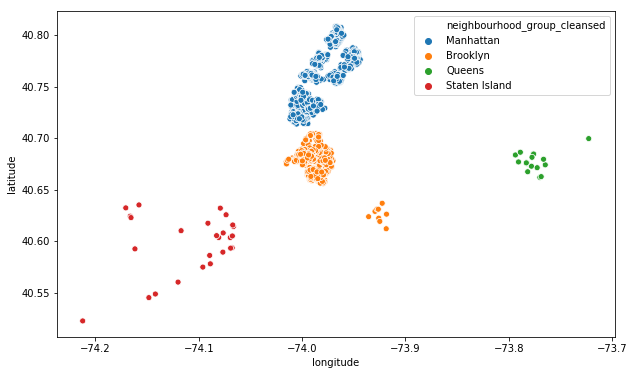

In [13]:
plt.figure(figsize=(10,6))
sns.scatterplot(df.longitude,df.latitude,hue=df.neighbourhood_group_cleansed)
plt.ioff()

### Manhattan has the maximum number of listings followed by Brooklyn, Staten Island and Queens

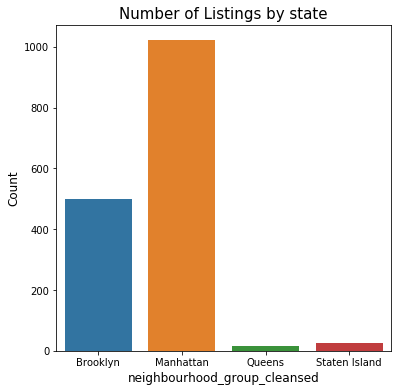

In [14]:
#Get a count by borough
state_count = df.groupby('neighbourhood_group_cleansed').agg('count').reset_index()
#Plot the count by borough
fig, ax1 = plt.subplots(1,1, figsize=(6,6)
                       )
sns.barplot(x='neighbourhood_group_cleansed', y='id', data=state_count, ax=ax1)

ax1.set_title('Number of Listings by state', fontsize=15)
ax1.set_xlabel('neighbourhood_group_cleansed', fontsize=12)
ax1.set_ylabel('Count', fontsize=12)
ax1.tick_params(axis='both', labelsize=10)

### Apartemnt has highest number of listings in the dataset 

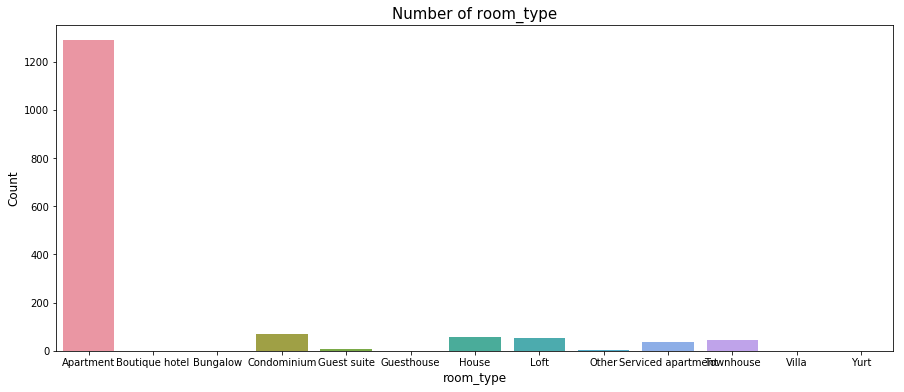

In [15]:
prop_type = df.groupby('property_type').agg('count').reset_index()
fig, ax1 = plt.subplots(1,1, figsize=(15,6))
                       
sns.barplot(x='property_type', y='id', data=prop_type, ax=ax1)

ax1.set_title('Number of room_type', fontsize=15)
ax1.set_xlabel('room_type', fontsize=12)
ax1.set_ylabel('Count', fontsize=12)
ax1.tick_params(axis='both', labelsize=10)

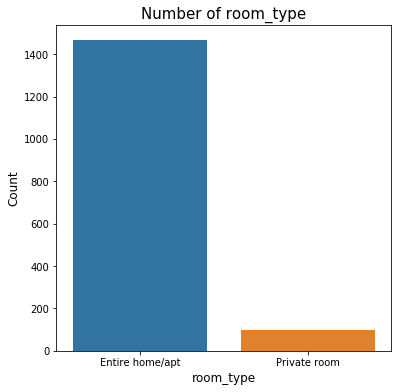

In [16]:
bed_count = df.groupby('room_type').agg('count').reset_index()
fig, ax1 = plt.subplots(1,1, figsize=(6,6)
                       )
sns.barplot(x='room_type', y='id', data=bed_count, ax=ax1)

ax1.set_title('Number of room_type', fontsize=15)
ax1.set_xlabel('room_type', fontsize=12)
ax1.set_ylabel('Count', fontsize=12)
ax1.tick_params(axis='both', labelsize=10)

### Entire home Apt room types are rented out more than  private rooms

In [17]:
pd.pivot_table(df,index='neighbourhood_group_cleansed',columns='room_type',values='price',aggfunc='mean')

room_type,Entire home/apt,Private room
neighbourhood_group_cleansed,,
Brooklyn,214.152542,128.071429
Manhattan,338.779979,167.904762
Queens,151.071429,85.000000
Staten Island,116.619048,103.200000


### Review Scores Rating 

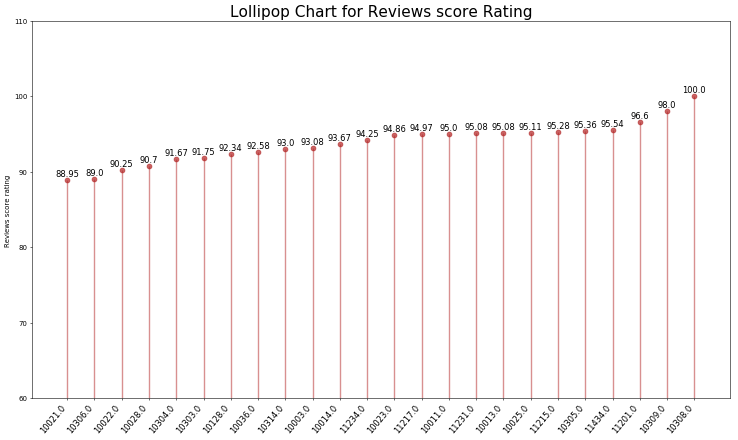

In [18]:
count=df.groupby('zipcode').agg({'review_scores_rating':['count','mean']}).sort_values(by=('review_scores_rating', 'mean'),ascending=False)
count=count[count['review_scores_rating','count']>60]

df_raw=df.groupby('zipcode')['review_scores_rating'].mean().sort_values().reset_index()
df_raw.dropna(inplace=True)

# Draw plot
fig, ax = plt.subplots(figsize=(18,10), dpi= 50)
ax.vlines(x=df_raw.index, ymin=0, ymax=df_raw.review_scores_rating, color='firebrick', alpha=0.5, linewidth=2)
ax.scatter(x=df_raw.index, y=df_raw.review_scores_rating, s=50, color='firebrick', alpha=0.7)

# Title, Label, Ticks and Ylim
ax.set_title('Lollipop Chart for Reviews score Rating', fontdict={'size':22})
ax.set_ylabel('Reviews score rating ')
ax.set_xticks(df_raw.index)
ax.set_xticklabels(df_raw.zipcode, rotation=50, fontdict={'horizontalalignment': 'right', 'size':12})
ax.set_ylim(60,110)

# Annotate
for row in df_raw.itertuples():
    ax.text(row.Index, row.review_scores_rating+.2, s=round(row.review_scores_rating, 2), horizontalalignment= 'center', verticalalignment='bottom', fontsize=12)

plt.show()

### zipcodes 11201,11215,10025,10013 and 11231 have the highest ratings above 95 with count of above 60 and hence are reliable 

In [19]:
for gp in set(df['neighbourhood_group_cleansed']):  
    print(df.loc[df['neighbourhood_group_cleansed']==gp,].groupby(['neighbourhood_group_cleansed','neighbourhood']).agg({'price':['count','mean']}).sort_values(by=('price', 'mean'),ascending=False).head())
    print()

                                           price            
                                           count        mean
neighbourhood_group_cleansed neighbourhood                  
Queens                       Queens           14  140.785714
                             Jamaica           3  133.000000

                                                        price             
                                                        count         mean
neighbourhood_group_cleansed neighbourhood                                
Brooklyn                     Prospect Heights               3  1431.666667
                             Brooklyn Heights               5   412.800000
                             Cobble Hill                    3   350.000000
                             Red Hook                       6   292.333333
                             Columbia Street Waterfront     2   230.000000

                                           price            
                                

In [20]:
name = []
price = []
for i in range(len(df.groupby(['neighbourhood']).mean()['price'])):
    name.append(df.groupby(['neighbourhood']).mean()['price'].reset_index().iloc[i][0])
    price.append(df.groupby(['neighbourhood']).mean()['price'].reset_index().iloc[i][1])
    
dfcsv = pd.DataFrame({'name':name,'Price':price})
df_Places = gpd.read_file('Neighborhood Tabulation Areas (NTA).geojson')
df_Places.rename(columns={'ntaname':'name'},inplace=True) 

nam1 = []
geom1 = []
for i in dfcsv['name']:
    for j in range(len(df_Places['name'])):
        if re.sub('- ','',df_Places['name'][j]).lower().find(re.sub('- ','',i).lower()) != -1 :
            nam1.append(i)
            geom1.append(df_Places['geometry'][j])
dfclean = pd.DataFrame({'name':nam1,'geometry':geom1})

df_un = gpd.read_file('USA New York City neighborhood 20190128.geojson')
df_un = df_un[['name','geometry']]
dffull = pd.concat([dfclean,df_un])
dffull = gpd.GeoDataFrame(dffull)

fig = px.choropleth(dfcsv, geojson=dffull, locations='name', color='Price',
                           color_continuous_scale="Viridis",
                           range_color=(0, 700),
                           projection="mercator",featureidkey = "properties.name",
                           labels={'Price':'Mean price of houses'}
                          )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### profitability on short term rentals by zip code

In [21]:
arr=[]
for col in df.columns:
    if '2017' in col:
        arr.append(col)
arr

['2017-01', '2017-02', '2017-03', '2017-04', '2017-05', '2017-06']

### In zillow data set the house prices are on monthly level. So i have taken mean of the year 2017 as a price estimate

# Metrics used for calculating profit generated by the profits :
- Total revenue generated rom renting the property is calculated by price per night* occupancy rate(0.75)*365(No. of days)
- Break even period : No. of years it will take for the property to recover its costs, Mean House price/expected revenue

In [22]:
df['2017_mean']=df[arr].mean(axis=1)
df['ER']=df['price']*0.75*365
df['break_even']=round((df['2017_mean']/df['ER']),2)
df['break_even'].describe()


C:\Users\harki\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\harki\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\harki\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/panda

count    1565.000000
mean       28.672319
std        17.054683
min         1.140000
25%        18.070000
50%        25.370000
75%        33.650000
max       181.220000
Name: break_even, dtype: float64

### From the plot below we can see that zipcodes in manhattan has higher house price values than other neighbourhoods

In [23]:
ts=df.groupby(['neighbourhood_group_cleansed','zipcode'])['2017_mean'].mean().reset_index()
ts['zipcode']=ts['zipcode'].astype(str)
fig = px.line(ts, x="zipcode", y="2017_mean", title='2017 Median House price values ',hover_name='neighbourhood_group_cleansed')
fig.update_layout(xaxis_type='category'
                   )
fig.show()

### Expected revenue generated in each Zipcode

In [25]:
Manhattan=df[df['neighbourhood_group_cleansed']=='Manhattan']
Manhattan=Manhattan.groupby(['neighbourhood_group_cleansed','zipcode'])['ER'].mean().reset_index()
Brooklyn=df[df['neighbourhood_group_cleansed']=='Brooklyn']
Brooklyn=Brooklyn.groupby(['neighbourhood_group_cleansed','zipcode'])['ER'].mean().reset_index()
Queens=df[df['neighbourhood_group_cleansed']=='Queens']
Queens=Queens.groupby(['neighbourhood_group_cleansed','zipcode'])['ER'].mean().reset_index()
Staten_Island=df[df['neighbourhood_group_cleansed']=='Staten Island']
Staten_Island=Staten_Island.groupby(['neighbourhood_group_cleansed','zipcode'])['ER'].mean().reset_index()


fig = go.Figure()
fig.add_trace(go.Bar(
    x=Manhattan['zipcode'],
    y=Manhattan['ER'],
    name='Manhattan',
    marker_color='orange'
))
fig.add_trace(go.Bar(
    x=Brooklyn['zipcode'],
    y=Brooklyn['ER'],
    name='Brooklyn',
    marker_color='lightsalmon'
))
fig.add_trace(go.Bar(
    x=Queens['zipcode'],
    y=Queens['ER'],
    name='Queens',
    marker_color='yellow'
))
fig.add_trace(go.Bar(
    x=Staten_Island['zipcode'],
    y=Staten_Island['ER'],
    name='Staten Island',
    marker_color='pink'
))

fig.update_layout(xaxis_type='category',barmode='group',yaxis_title="Expected revenue",)
fig.show()

### Zipcodes 10013,10011 and 10022  from Manhattan have the highest expected revenue of above 95k annually. whereas zipcodes 10314,10309 and 10302 from Staten Island have the lowest ER  

# Break even period

In [26]:
Manhattan=df[df['neighbourhood_group_cleansed']=='Manhattan']
Brooklyn=df[df['neighbourhood_group_cleansed']=='Brooklyn']
Queens=df[df['neighbourhood_group_cleansed']=='Queens']
Staten_Island=df[df['neighbourhood_group_cleansed']=='Staten Island']
Manhattanbe=Manhattan.groupby(['neighbourhood_group_cleansed','zipcode'])['break_even'].mean().reset_index()
Brooklynbe=Brooklyn.groupby(['neighbourhood_group_cleansed','zipcode'])['break_even'].mean().reset_index()
Queensbe=Queens.groupby(['neighbourhood_group_cleansed','zipcode'])['break_even'].mean().reset_index()
Staten_Islandbe=Staten_Island.groupby(['neighbourhood_group_cleansed','zipcode'])['break_even'].mean().reset_index()


fig = go.Figure()
fig.add_trace(go.Bar(
    x=Manhattanbe['zipcode'],
    y=Manhattanbe['break_even'],
    name='Manhattan',
    marker_color='purple'
))
fig.add_trace(go.Bar(
    x=Brooklynbe['zipcode'],
    y=Brooklynbe['break_even'],
    name='Brooklyn',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=Queensbe['zipcode'],
    y=Queensbe['break_even'],
    name='Queens',
    marker_color='pink'
))
fig.add_trace(go.Bar(
    x=Staten_Islandbe['zipcode'],
    y=Staten_Islandbe['break_even'],
    name='Staten Island',
    marker_color='skyblue'
))
fig.update_layout(xaxis_type='category',barmode='group',yaxis_title="Break even period",)
fig.show()

### Manhattan and brooklyn zipcodes have the highest breakeven period with an average of 30 years which is not preferrable. Zipcodes in Queens and staten Island have the lowest break even period with lowest in queens, 11003(7 years)

In [27]:
avail_90=df.groupby(['neighbourhood_group_cleansed','zipcode'])['availability_365'].mean().sort_values().reset_index()
avail_90['avail_perc']=avail_90['availability_365']/365


Text(0, 0.5, ' % availability within 90 days ')

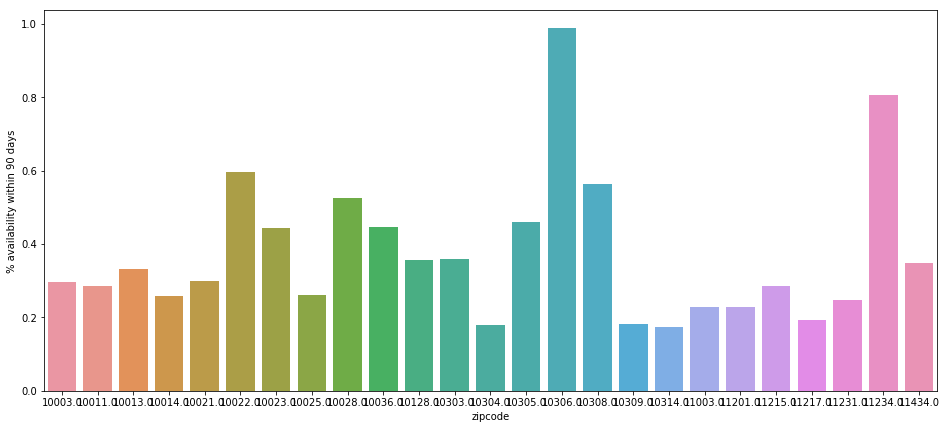

In [28]:
plt.figure(figsize=(16,7))
sns.barplot(x="zipcode", y="avail_perc", data=avail_90)
plt.ylabel(" % availability within 90 days ")


### Zipcodes 11217, 100025 and 11231 have availability less than 20% and hence can be targetted as they have pretty good expected revenues as well.